#Overview
This notebook explores Masked Autoencoders (MAEs) and Vision Transformers (ViTs) for image reconstruction and downstream tasks:

- Custom MAE Implementation:

Builds and trains an encoder-decoder model on MNIST for reconstructing masked images.
Visualizes reconstruction quality and identifies areas for improvement.

- Pre-trained ViT-MAE:

Leverages a pre-trained Vision Transformer for powerful feature extraction and superior image reconstruction.
Applies embeddings for downstream tasks like classification using logistic regression.

- Key Insights:

Demonstrates the strength of MAE-based pretraining in capturing meaningful features.
Achieves high accuracy on classification tasks with minimal additional training.

# Masked Auto-Encoders (MAE)
Paper: https://arxiv.org/abs/2111.06377
References: https://github.com/NielsRogge/Transformers-Tutorials/blob/master/ViTMAE/ViT_MAE_visualization_demo.ipynb

## Pre-requisites:
### Please use the given dog.jpg and upload it to current session. Upload should take just a few seconds.

## Installing required packages

In [ ]:
!pip install lightly datasets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 4.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 834.9/834.9 kB 16.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 19.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.6/137.6 kB 9.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 8.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 14.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 13.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 10.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 815.2/815.2 kB 22.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 891.4/891.4 kB 32.3 MB/s eta

## Part 1: Import required packages

In [ ]:
import torch
import torchvision
from timm.models.vision_transformer import vit_base_patch32_224
from torch import nn
from lightly.models import utils
from lightly.models.modules import MAEDecoderTIMM, MaskedVisionTransformerTIMM
from lightly.transforms import MAETransform
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from torchvision import datasets, transforms
from transformers import ViTFeatureExtractor
import requests
from PIL import Image
from transformers import ViTMAEForPreTraining
from transformers import AutoImageProcessor, ViTForImageClassification
import torch
from datasets import load_dataset
import zipfile
import os
from transformers import AutoImageProcessor, ViTForImageClassification
from torchvision import transforms
from torch.optim import AdamW
from torch.optim.lr_scheduler import StepLR
from transformers import get_scheduler
from transformers import AutoImageProcessor, ViTModel
import numpy as np
from sklearn.cluster import KMeans
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import tqdm

## Part 2: Implementing a simple CNN MAE from scratch

## Define and download dataset

In [ ]:
# Load the MNIST dataset
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))  # Normalize to [-1, 1]
])
#Download the MNIST dataset
train_dataset = datasets.MNIST(root='./data', train=True, transform=transform, download=True)
test_dataset = datasets.MNIST(root='./data', train=False, transform=transform, download=True)
train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False)


Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 9.91M/9.91M [00:00<00:00, 12.7MB/s]


Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 28.9k/28.9k [00:00<00:00, 341kB/s]


Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 1.65M/1.65M [00:00<00:00, 3.22MB/s]


Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 4.54k/4.54k [00:00<00:00, 2.78MB/s]

Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw



## Model Definition

In [ ]:
# Custom masking layer
class MaskingLayer(nn.Module):
    def __init__(self, mask_ratio=0.5):
        super(MaskingLayer, self).__init__()
        self.mask_ratio = mask_ratio

    def forward(self, x):
        # Generate a random mask
        mask = (torch.rand_like(x) > self.mask_ratio).float()
        return x * mask

# Encoder
class Encoder(nn.Module):
    def __init__(self):
        super(Encoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU()
        )
        self.apply(self.init_weights)

    def init_weights(self, m):
        if isinstance(m, nn.Conv2d):
            nn.init.xavier_uniform_(m.weight)

    def forward(self, x):
        return self.encoder(x)

# Decoder
class Decoder(nn.Module):
    def __init__(self):
        super(Decoder, self).__init__()
        self.decoder = nn.Sequential(
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.Conv2d(128, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.Conv2d(64, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 1, kernel_size=3, padding=1),
            nn.Sigmoid()
        )
        self.apply(self.init_weights)

    def init_weights(self, m):
        if isinstance(m, nn.Conv2d):
            nn.init.xavier_uniform_(m.weight)

    def forward(self, x):
        return self.decoder(x)

# Combine into a Masked Autoencoder model
class MaskedAutoencoder(nn.Module):
    def __init__(self, mask_ratio=0.5):
        super(MaskedAutoencoder, self).__init__()
        self.masking_layer = MaskingLayer(mask_ratio)
        self.encoder = Encoder()
        self.decoder = Decoder()

    def forward(self, x):
        masked_x = self.masking_layer(x)
        latent = self.encoder(masked_x)
        reconstructed = self.decoder(latent)
        return reconstructed

# Initialize model, loss function, and optimizer
model = MaskedAutoencoder(mask_ratio=0.4).cuda()
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)



## Training the model

In [ ]:
# Training loop
epochs = 10
for epoch in range(epochs):
    model.train()
    running_loss = 0.0
    for images, _ in train_loader:
        images = images.cuda()
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, images)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()

    print(f"Epoch [{epoch+1}/{epochs}], Loss: {running_loss/len(train_loader):.4f}")



Epoch [1/25], Loss: 0.9314
Epoch [2/25], Loss: 0.9254
Epoch [3/25], Loss: 0.9254
Epoch [4/25], Loss: 0.9254
Epoch [5/25], Loss: 0.9254
Epoch [6/25], Loss: 0.9254
Epoch [7/25], Loss: 0.9254
Epoch [8/25], Loss: 0.9254
Epoch [9/25], Loss: 0.9254
Epoch [10/25], Loss: 0.9254
Epoch [11/25], Loss: 0.9254
Epoch [12/25], Loss: 0.9254
Epoch [13/25], Loss: 0.9254
Epoch [14/25], Loss: 0.9254
Epoch [15/25], Loss: 0.9254


KeyboardInterrupt: 

## Visualize the reconstructed images

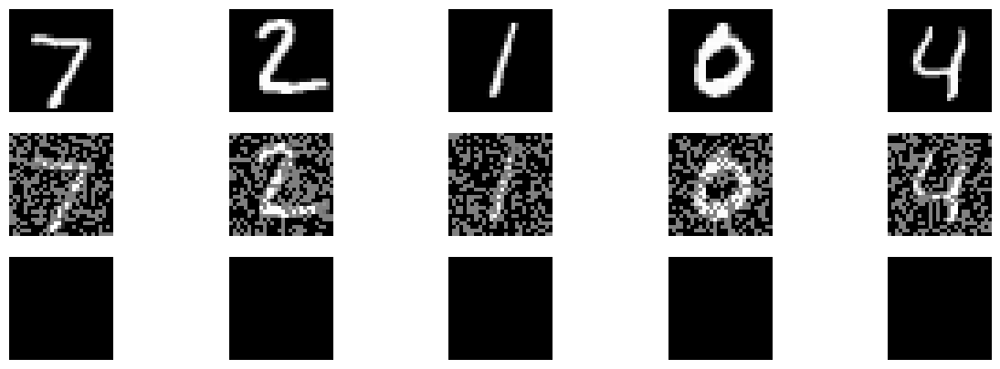

In [ ]:
# Test the model with a few masked and reconstructed images
model.eval()
with torch.no_grad():
    test_images, _ = next(iter(test_loader))
    test_images = test_images.cuda()
    masked_images = model.masking_layer(test_images)
    reconstructed_images = model(test_images)

# Plot original, masked, and reconstructed images
plt.figure(figsize=(15, 5))
for i in range(5):
    # Original images
    plt.subplot(3, 5, i + 1)
    plt.imshow(test_images[i].cpu().squeeze(), cmap='gray')
    plt.axis('off')

    # Masked images
    plt.subplot(3, 5, i + 6)
    plt.imshow(masked_images[i].cpu().squeeze(), cmap='gray')
    plt.axis('off')

    # Reconstructed images
    plt.subplot(3, 5, i + 11)
    plt.imshow(reconstructed_images[i].cpu().squeeze(), cmap='gray')
    plt.axis('off')

plt.show()

## Discussion
### We observe the loss values and the reconstruction images are poor. This was just an exercise to demonstrate how MAE works. But this suggests that there is room for improvement in terms of more complex models and more training data. Now that we know how MAEs work, we move onto leveraging some powerful pretrained models that we trained on millions of images. The upcoming tutorial deals with very little coding and the packages abstract most of it and let us focus on how they could be used for downstream tasks


## Part 3: Using Pretrained ViT for visualizing reconstruction

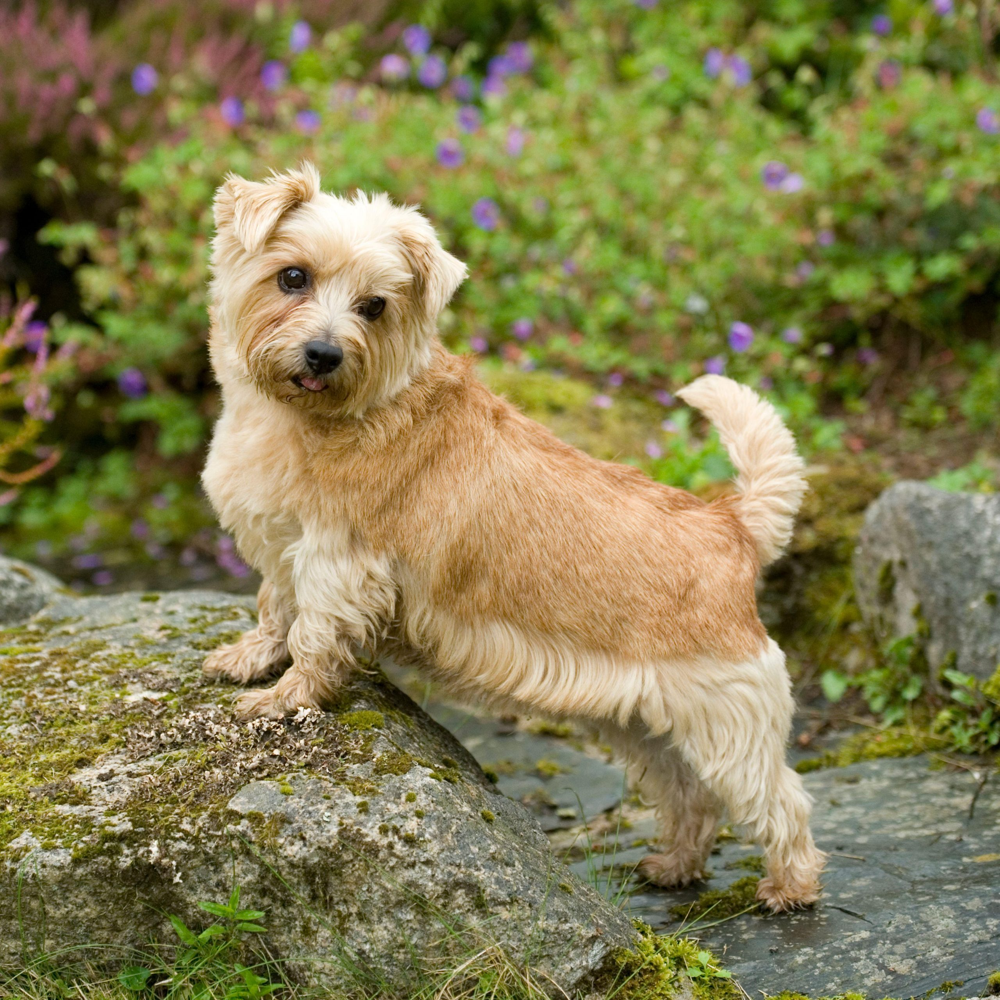

In [ ]:
# We use the base ViT model and its corresponding MAE weights
feature_extractor = ViTFeatureExtractor.from_pretrained("facebook/vit-mae-base")
image = Image.open('/content/dog.jpg')
image

In [ ]:
#We pass the image through the MAE extractor
pixel_values = feature_extractor(image, return_tensors="pt").pixel_values

In [ ]:
#Let's visualize the reconstruction

imagenet_mean = np.array(feature_extractor.image_mean)
imagenet_std = np.array(feature_extractor.image_std)

def show_image(image, title=''):
    # image is [H, W, 3]
    assert image.shape[2] == 3
    plt.imshow(torch.clip((image * imagenet_std + imagenet_mean) * 255, 0, 255).int())
    plt.title(title, fontsize=16)
    plt.axis('off')
    return

def visualize(pixel_values, model):
    # forward pass
    outputs = model(pixel_values)
    y = model.unpatchify(outputs.logits)
    y = torch.einsum('nchw->nhwc', y).detach().cpu()

    # visualize the mask
    mask = outputs.mask.detach()
    mask = mask.unsqueeze(-1).repeat(1, 1, model.config.patch_size**2 *3)  # (N, H*W, p*p*3)
    mask = model.unpatchify(mask)  # 1 is removing, 0 is keeping
    mask = torch.einsum('nchw->nhwc', mask).detach().cpu()

    x = torch.einsum('nchw->nhwc', pixel_values)

    # masked image
    im_masked = x * (1 - mask)

    # MAE reconstruction pasted with visible patches
    im_paste = x * (1 - mask) + y * mask

    # make the plt figure larger
    plt.rcParams['figure.figsize'] = [24, 24]

    plt.subplot(1, 4, 1)
    show_image(x[0], "original")

    plt.subplot(1, 4, 2)
    show_image(im_masked[0], "masked")

    plt.subplot(1, 4, 3)
    show_image(y[0], "reconstruction")

    plt.subplot(1, 4, 4)
    show_image(im_paste[0], "reconstruction + unmasked")

    plt.show()

config.json:   0%|          | 0.00/676 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/448M [00:00<?, ?B/s]

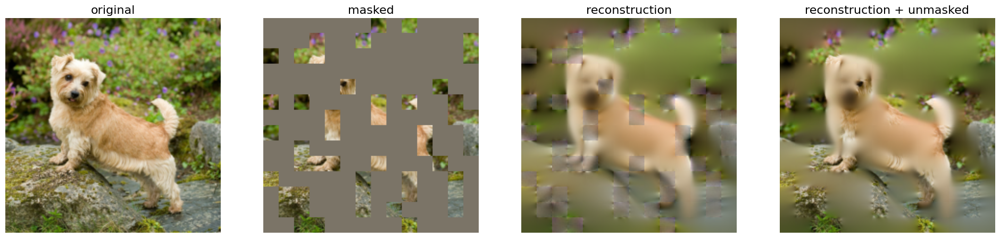

In [ ]:
# make random mask reproducible
torch.manual_seed(2)

model = ViTMAEForPreTraining.from_pretrained("facebook/vit-mae-base")

visualize(pixel_values, model)

##Discussion
### We can clearly see how powerful this model is based on the reconstruction, now let's see how it could be used for downstream tasks

## Part 4: Linear probing using pretrained ViT MAE

##Download CIFAR-10 dataset

In [ ]:
# Load CIFAR-10 with the transformation applied
train_dataset = datasets.CIFAR10(root="data_cifar", train=True, transform=transform, download=True)
test_dataset = datasets.CIFAR10(root="data_cifar", train=False, transform=transform, download=True)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
You are using a model of type vit_mae to instantiate a model of type vit. This is not supported for all configurations of models and can yield errors.
Some weights of ViTModel were not initialized from the model checkpoint at facebook/vit-mae-base and are newly initialized: ['vit.pooler.dense.bias', 'vit.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Extracting Embeddings: 0it [00:31, ?it/s]


Linear Probe Accuracy on CIFAR-10 (Logistic Regression): 80.00%


## Define model and load pretrained ViT MAE weights

In [ ]:
# Initialize ViT model for embedding extraction
model_name = "facebook/vit-mae-base"
image_processor = AutoImageProcessor.from_pretrained(model_name)
model = ViTModel.from_pretrained(model_name)
model.eval()

## Extract embeddings from pretrained MAE.
In the interest of time, we do this just for 500 samples.

In [ ]:
# Helper function to extract embeddings with progress bar and sample limit
def extract_embeddings(dataloader, sample_limit=500):
    embeddings = []
    labels = []
    processed_samples = 0

    with torch.no_grad():
        for images, batch_labels in tqdm(dataloader, desc="Extracting Embeddings", total=sample_limit // dataloader.batch_size):
            outputs = model(images)
            batch_embeddings = outputs.last_hidden_state[:, 0, :].cpu().numpy()  # Extract [CLS] token embeddings

            embeddings.append(batch_embeddings)
            labels.extend(batch_labels.numpy())
            processed_samples += images.size(0)

            if processed_samples >= sample_limit:  # Stop once the sample limit is reached
                break

    embeddings = np.vstack(embeddings)[:sample_limit]
    labels = np.array(labels)[:sample_limit]
    return embeddings, labels

# Extract embeddings for only the first 500 samples from train and test sets
train_embeddings, train_labels = extract_embeddings(train_loader, sample_limit=500)
test_embeddings, test_labels = extract_embeddings(test_loader, sample_limit=50)



## Train logistic regression model

In [ ]:
#Train a logistic regression model as a linear probe
classifier = LogisticRegression(max_iter=1000, random_state=42)
classifier.fit(train_embeddings, train_labels)

# Evaluate the linear probe on the test set
test_predictions = classifier.predict(test_embeddings)
accuracy = accuracy_score(test_labels, test_predictions)

## Linear-Probing Results

In [ ]:
print(f"Linear Probe Accuracy on CIFAR-10 (Logistic Regression): {accuracy * 100:.2f}%")

Linear Probe Accuracy on CIFAR-10 (Logistic Regression): 80.00%


## Discussion
### The Vision Transformer (ViT) model with Masked Autoencoding (MAE) pretraining learns powerful, generalizable features by reconstructing masked parts of images. Using linear probing—a simple logistic regression on these frozen embeddings—we achieved 80% accuracy on CIFAR-10 without additional training. This result highlights the strength of ViT-MAE embeddings in capturing meaningful visual patterns for effective classification.